## Chapter 11: Principles of Feature Learning

# 11.2 The bias-variance trade-off

- We have just seen how any number of *universal approximators* can be used to approximate *perfect data* as well as desired.  All we need do is employ enough units of a particular universal approximator and tune their parameters via the minimization of an appropriate cost.  


- With real data this phenomenon does not change - so long as we use enough units of a particular universal approximator and tune their parameters properly we can approximate real data as closely as we like.


- However with *real* data this universal approximation produces a seriously undesirable effect: after a certain point *better* we make our nonlinear model fit our training data the *worse* it may represent the overall phenomenon that generates our data and - in particular - the worse it will represent data we recieve in the future.


- Thus in practice when employing a nonlinear model built from a set of universal approximator units the *effect* of our model can range from being too *inflexible* (an *underfitting* model)  to being too *flexible* (an *overfitting* model).  This problem is often referred to as the *bias-variance trade-off* and is the subject of this brief Section.


- Again for simplicity here we largely focus on regression and two-class classification examples, however the fruits of this entire discussion are widely applicable to other problem types

In [1]:
## This code cell will not be shown in the HTML version of this notebook
# imports from custom library
import sys
sys.path.append('../../')
import autograd.numpy as np
from mlrefined_libraries import nonlinear_superlearn_library as nonlib
datapath = '../../mlrefined_datasets/nonlinear_superlearn_datasets/'

# plotting tools
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# this is needed to compensate for %matplotlib notebook's tendancy to blow up images when plotted inline
%matplotlib notebook
from matplotlib import rcParams
rcParams['figure.autolayout'] = True

%load_ext autoreload
%autoreload 2


(when too few / too rigid of universal approximators are used and / or the parameters of the model are not tuned sufficiently) to 


- when employing too few / too rigid of universal approximators and / or when not tuning their parameters appropriately - to being *too flexible* - when too many / too flexible of universal approximators are used and/or when tuning their parameters *too well*

## 11.2.1  Universal approximators and real data

In the previous Section we saw how a nonlinear model built from units of a single universal approximator can be made to represent any *perfect dataset* - provided we choose enough units and tune the parameters of the model by minimizing an appropriate cost function.  Moreover, as we saw previously, the *more* units we add to the model and the *better* we tune its corresponding parameters the *better* our approximation becomes.  Precisely the same principle holds with *real data* - that is data that is *finite* and *noisy*: such a model can be made to represent real data as finely as we wish, and the more units we add to the model / the better we tune its parameters the better our model approximates the data.

#### <span style="color:#a50e3e;">Example 1. </span>   Universal approximation of real regression data

For example, below we animate the learning of a set of 100 single layer tanh neural network units to a realistic regression dataset that  is a 'real' version of like the 'perfect' regression dataset shown in the previous Subsection (that is, it is far smaller and noiser).  Here  show the fit corresponding to a nonlinear model built using $100$ $\text{tanh}$ neural network units, and illustrate the solid fit provided from the weights learned after a run of $5000$ gradient descent steps.  We also visualize the fit provided at several intermediary steps of this minimization.  

As you move the slider from left to right you can track which (weights of each) step of gradient descent is being used in the current fit shown by tracking where the red dot on the cost function history plot in the right panel is currently located.  As you pull the slider from left to right, using more and more refined weights, the resulting fit gets better (more representative of what the underlying data-generating phenomenon truly looks like).


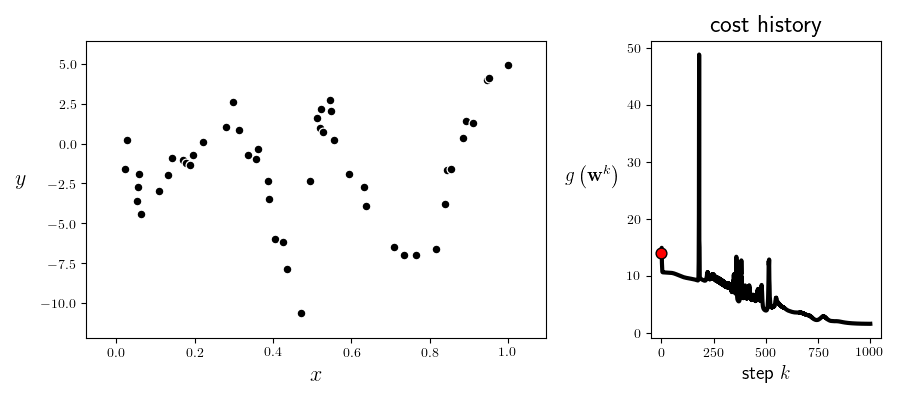
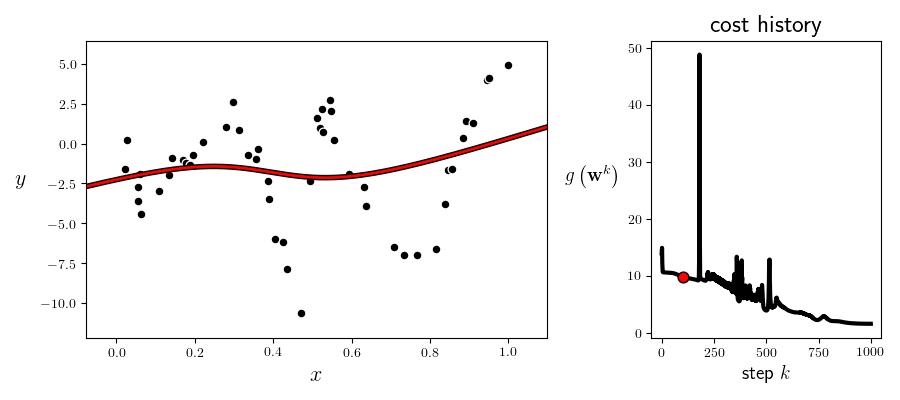
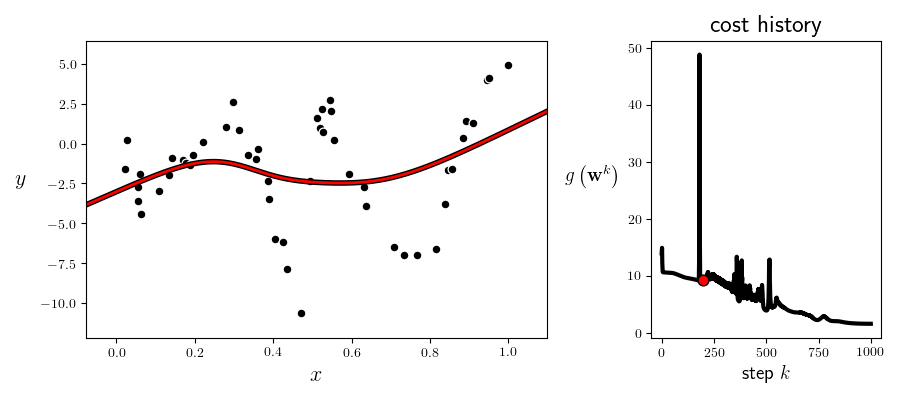
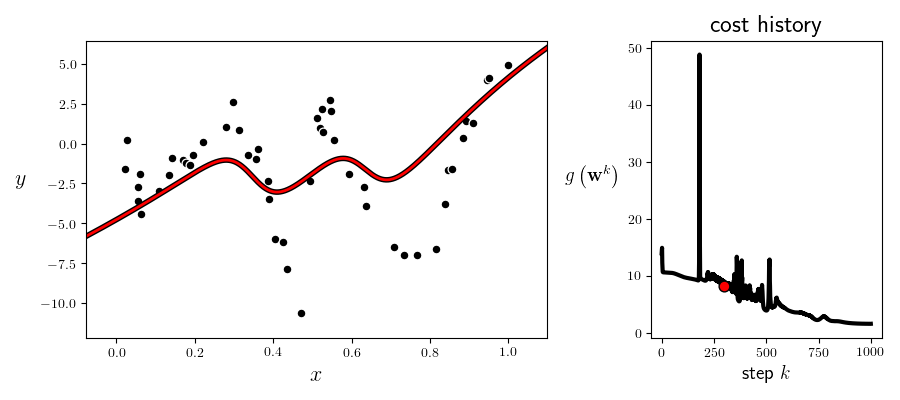
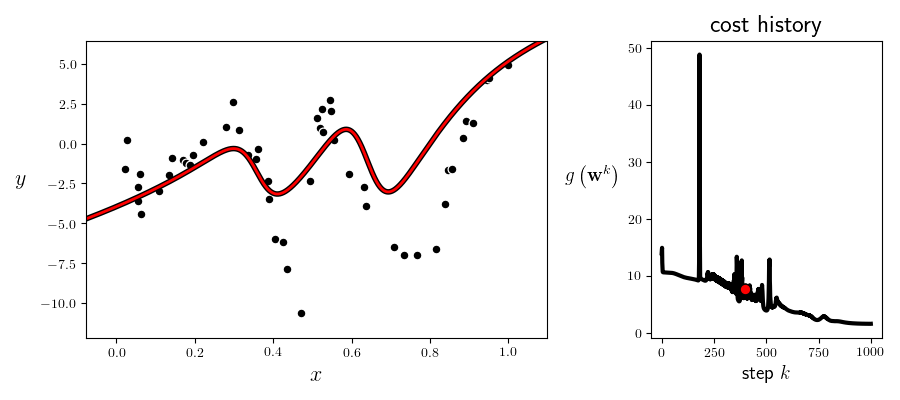
...
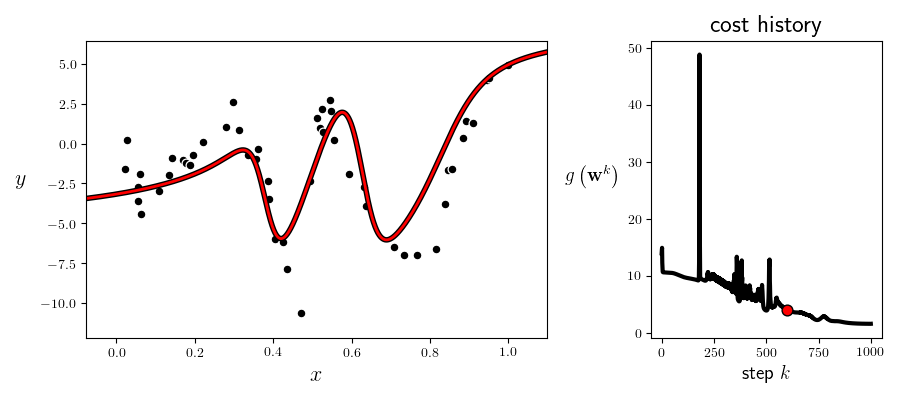
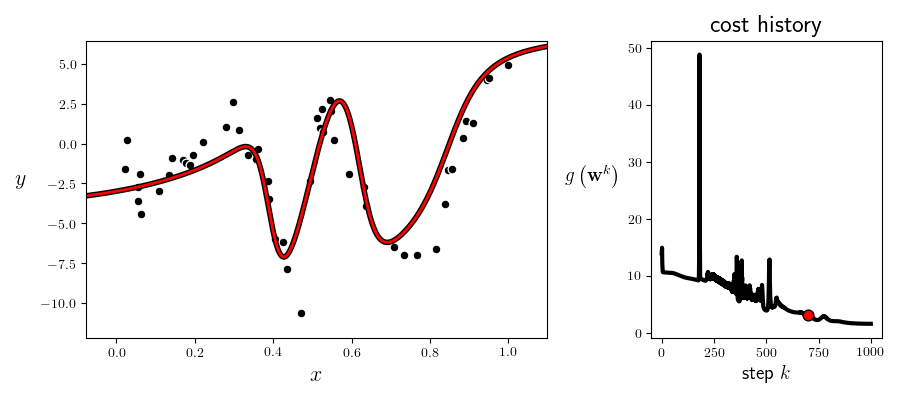
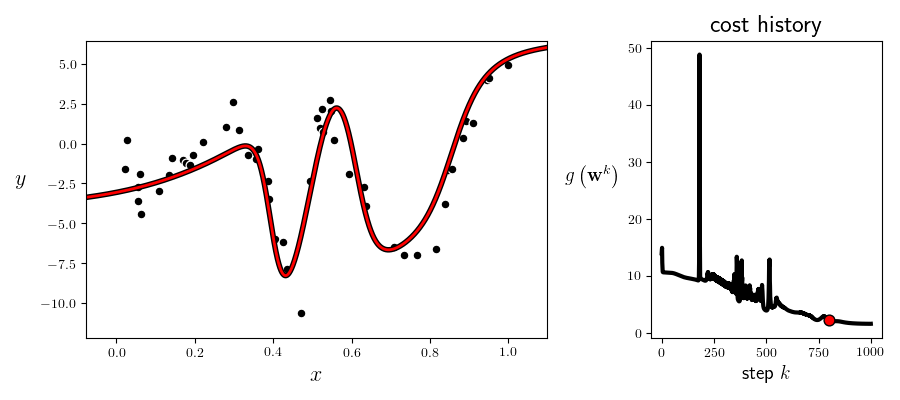
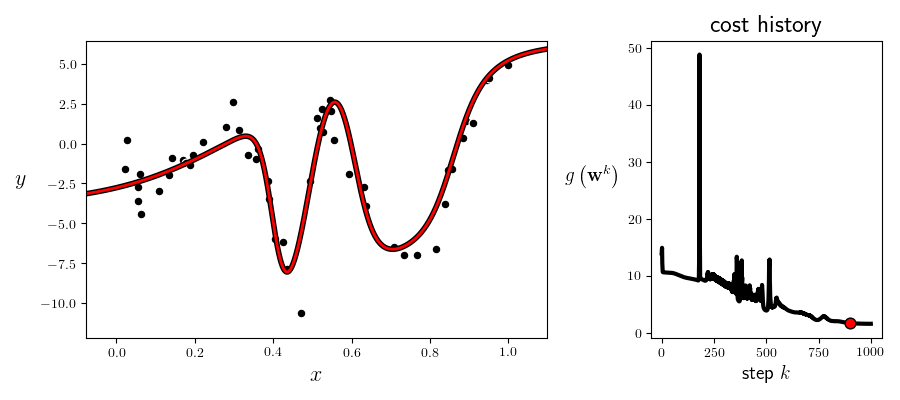
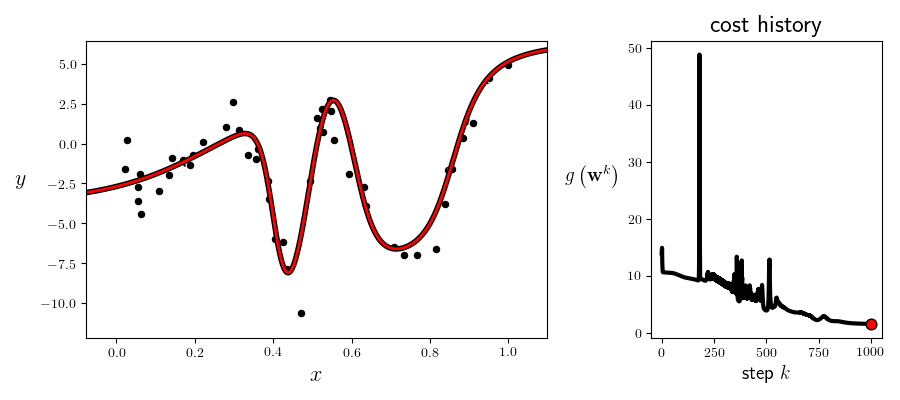

In [38]:
## This code cell will not be shown in the HTML version of this notebook
# load in dataset
csvname = datapath + 'universal_regression_samples_0.csv'

data = np.loadtxt(csvname,delimiter = ',')
x = data[:-1,:]
y = data[-1:,:] 

# import the v1 library
mylib5 = nonlib.library_v1.superlearn_setup.Setup(x,y)

# choose features
mylib5.choose_features(name = 'multilayer_perceptron',layer_sizes = [1,500,1],activation = 'tanh')

# choose normalizer
mylib5.choose_normalizer(name = 'standard')

# choose cost
mylib5.choose_cost(name = 'least_squares')

# fit an optimization
mylib5.fit(optimizer = 'gradient descent',max_its = 1000,alpha_choice = 10**(-1))

# load up animator
demo5 = nonlib.run_animators.Visualizer(csvname)

# pluck out a sample of the weight history
num_frames = 10 # how many evenly spaced weights from the history to animate

# animate based on the sample weight history
demo5.animate_1d_regression(mylib5,num_frames,scatter = 'points',show_history = True)

#### <span style="color:#a50e3e;">Example 2. </span>   Universal approximation of real classification data

However there is one very distinct difference between the case of 'perfect' and real data in terms of how we employ universal approximators to correctly determine the proper amount of nonlinearity present in real data: with real data we can tune the parameters of a model employing universal approximators *too well*, and/or use too many of universal approximators, and/or use universal approximators that are too nonlinear for the dataset given.  In short, the model we use (a linear combination of universal approximators) can be too nonlinear for a real dataset.  

For example, below we animate the fit provided by a large number of polynomial units to the real regression dataset shown in the first two examples of this Subsection.  Here we progressively fit more and more polynomial units to this dataset, displaying the resulting fit and corresponding Least Squares error provided by the nonlinear `model`.  As you move the slider from left to right you can see the result of fitting each successive polynomial `model` to the dataset, with the number of polynomials in the `model` shown displayed over the left panel (where the data and corresponding fit are shown).  In the right panel we show the Least squares error - or cost function value - of this `model`.  As you can see moving the slider from left to right, adding more polynomial units always *decreases* the cost function value (just as in the 'perfect' data case) however the resulting fit - after a certain point - actually gets *worse*.  It is not that the model is fitting the *training* data worse as the `model` becomes more flexible, it is simply that after a certain number of universal approximators are used (here around 15) the tuned `model` clearly becomes too nonlinear for the phenomenon at hand, and hence becomes a poor `model` for future *test data*.


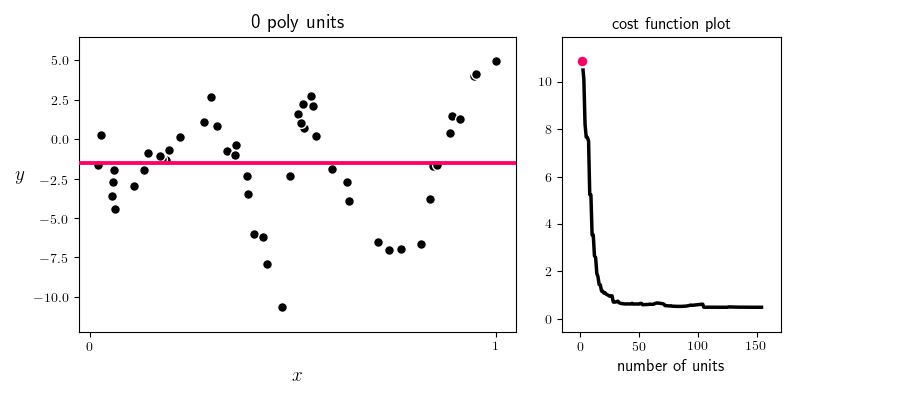
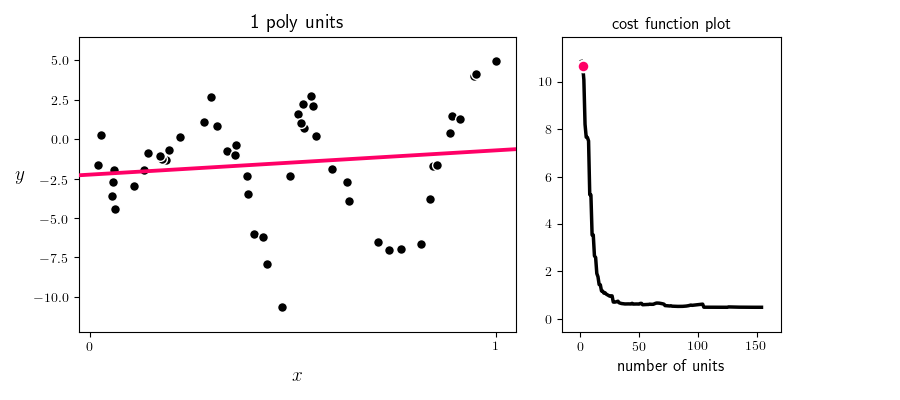
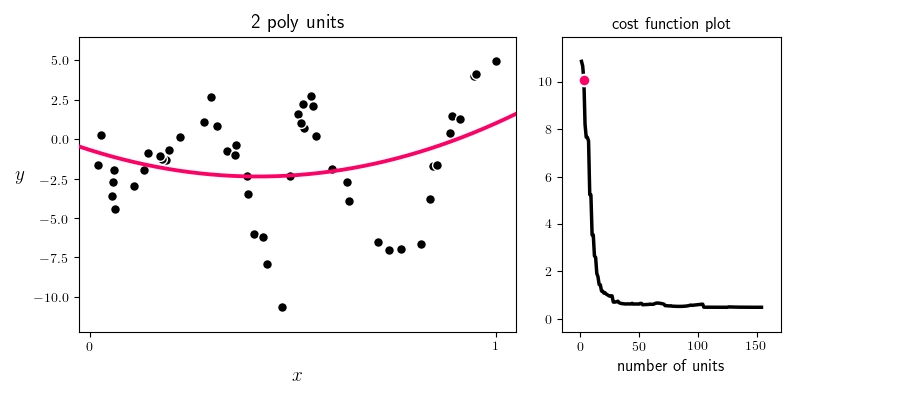
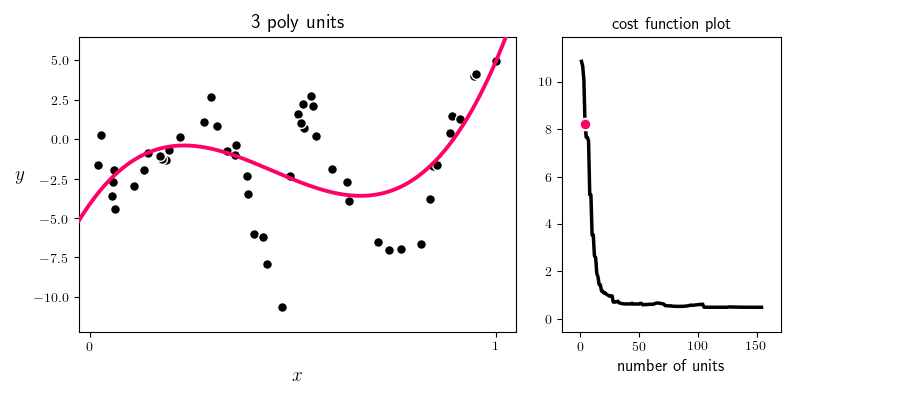
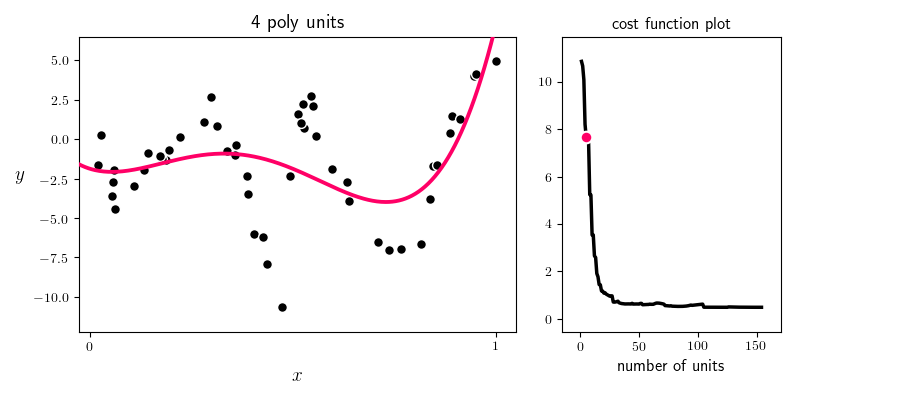
...
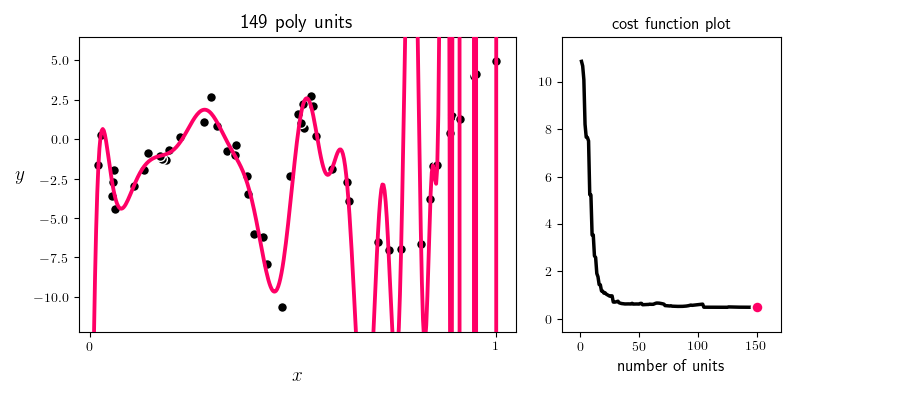
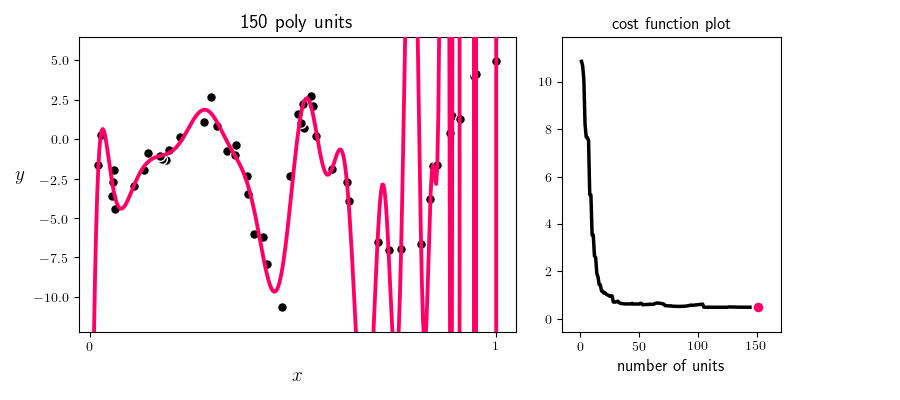
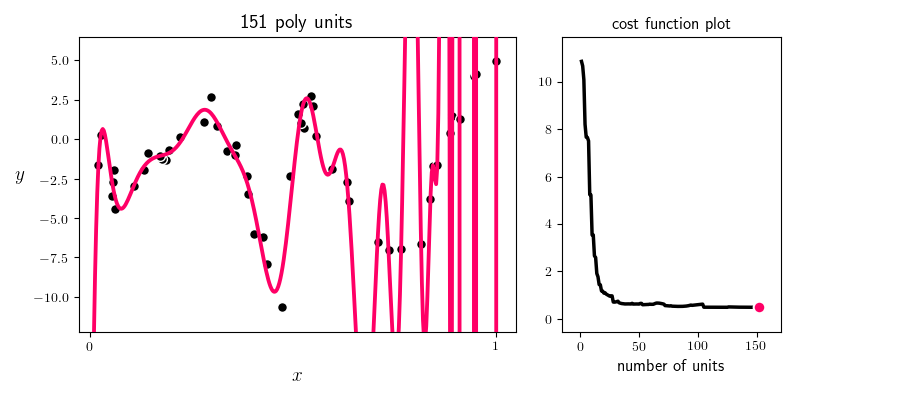
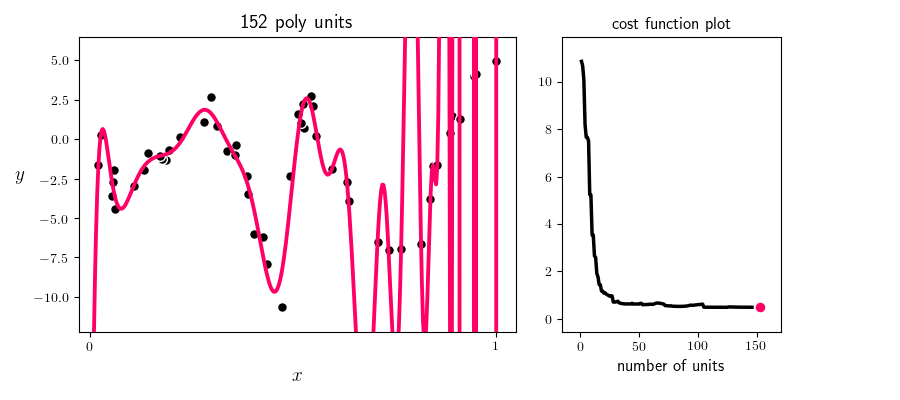
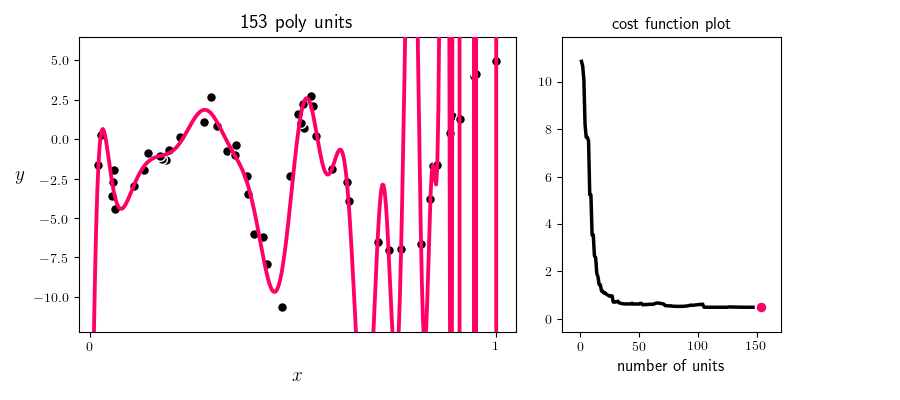

In [499]:
## This code cell will not be shown in the HTML version of this notebook
# load in nonlinear regression demo and run over range of units
demo10 = nonlib.regression_basis_single.Visualizer()
csvname = datapath + 'universal_regression_samples_0.csv'

demo10.load_data(csvname)
demo10.brows_single_fit(basis='poly',num_units = [v for v in range(1,155,1)])

This sort of phenomenon is a problem regardless of the sort of universal approximator we use - whether it be a kernel, neural network, or tree-based catalog of functions.  As another example, below we animate the fitting of $1$ through $20$ polynomials (left panel), single layer tanh neural network (middle panel), and stump units (right panel) to the simple sinusoidal regression dataset we have used previously in e.g., the first example in Section 12.1.  As you move the slider from left to right you will see the fit resulting from the use of more and more of each type of unit.  As you continue to add units in each case the resulting fit indeed provides a better fit to the training data, but after a certain point for each type of universal approximator the fit clearly becomes poor for future test data.


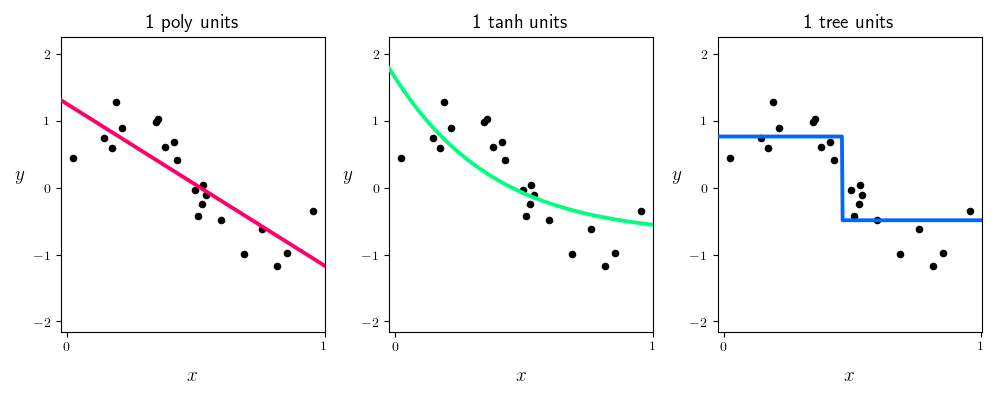
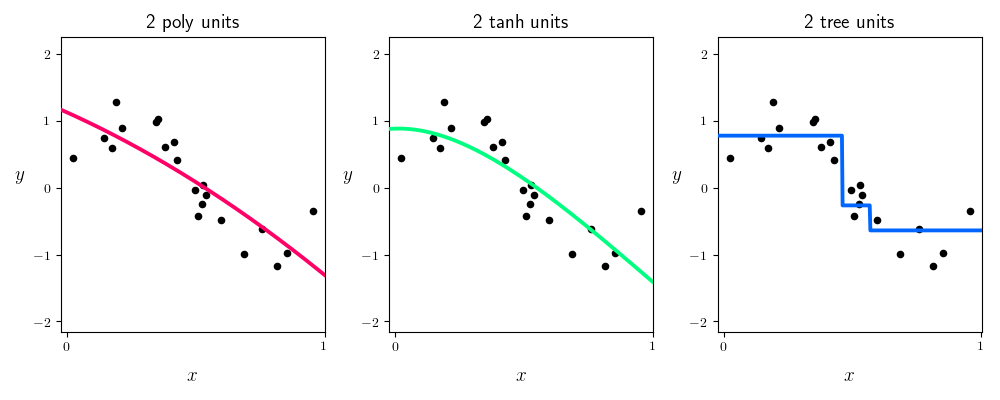
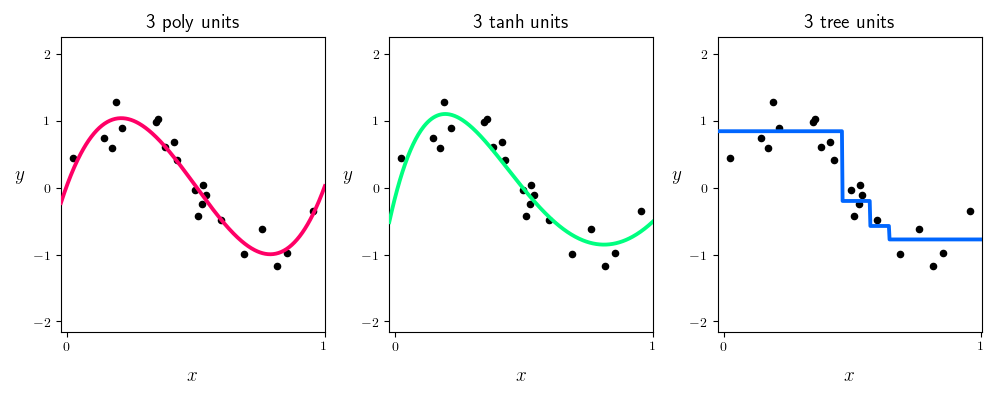
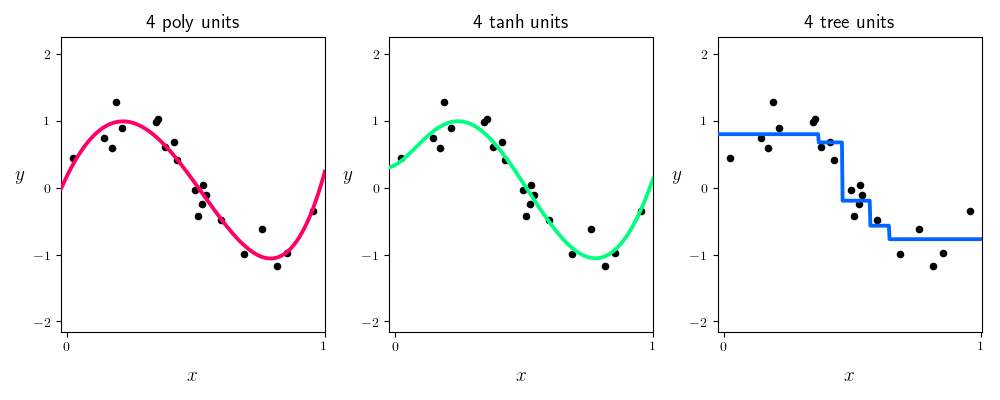
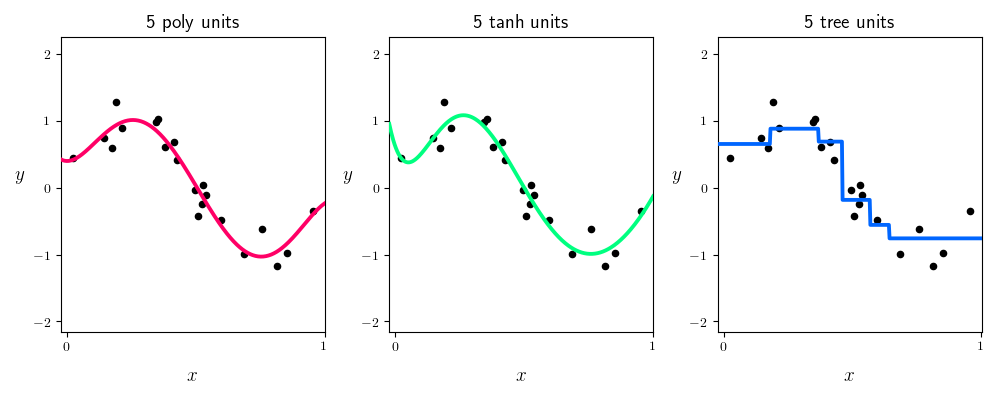
...
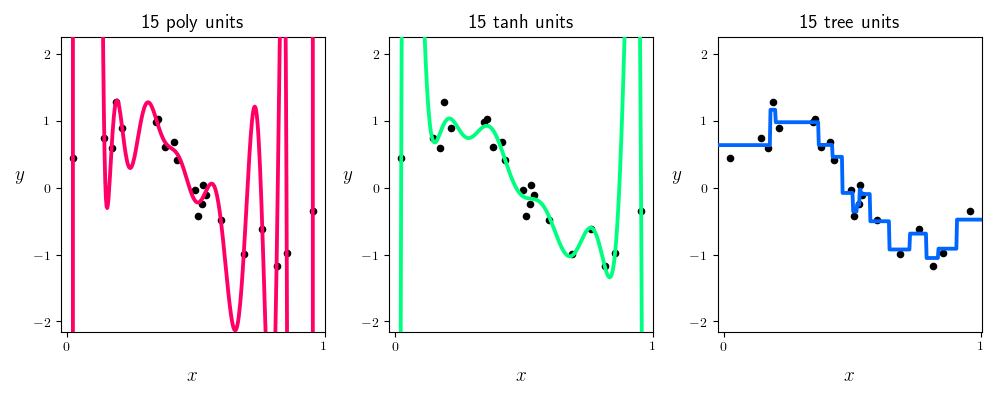
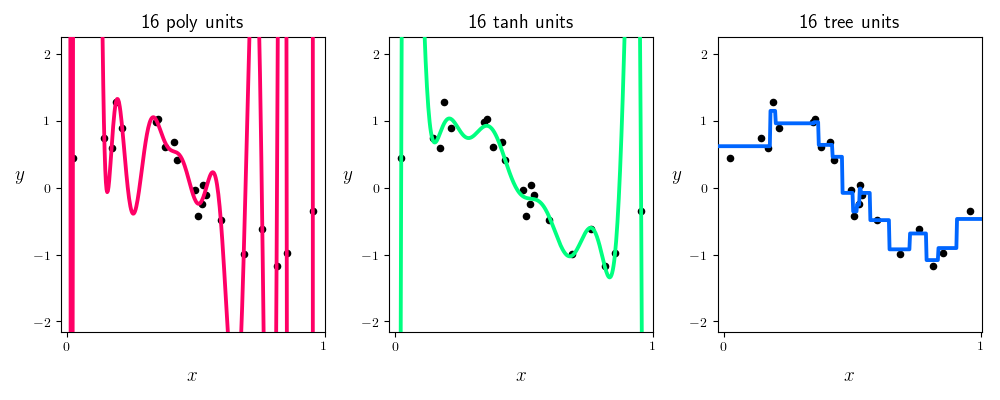
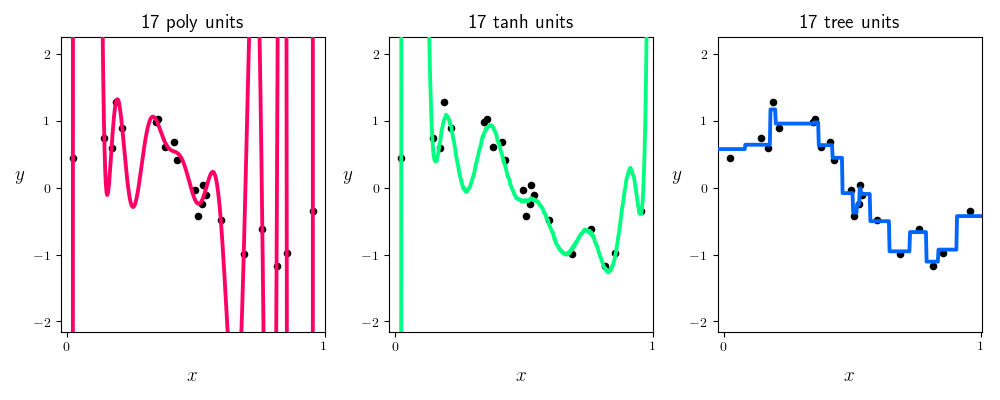
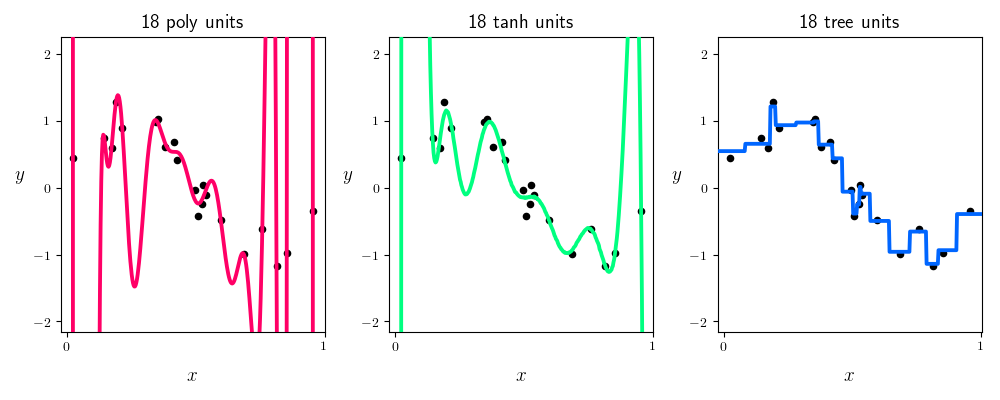
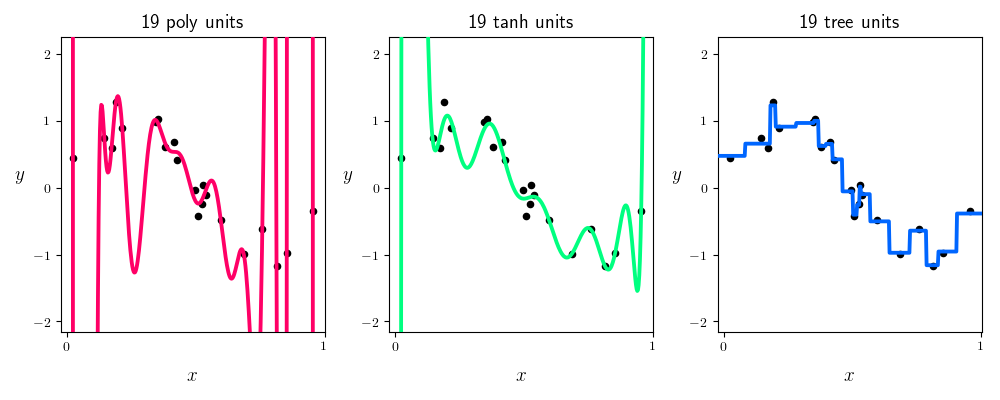

In [503]:
## This code cell will not be shown in the HTML version of this notebook
# run comparison demo for regression using all three main catalogs of universal approximators
demo11 = nonlib.regression_basis_comparison_2d.Visualizer()
csvname = datapath + 'noisy_sin_sample.csv'
demo11.load_data(csvname)
demo11.brows_fits(num_elements = [v for v in range(1,20,1)])

As with regression, this sort of phenomenon can happen irregardless of the sort of universal approximator we use.  For example, below we show the subsequent fitting of a few degree $D$ polynomials in the range between $1$ through and $50$ to the same dataset.  While the cost function value / fit to the training data indeed decreases with each subsequent polynomial, as you can see - after a certain point - the fit becomes far too nonlinear. 


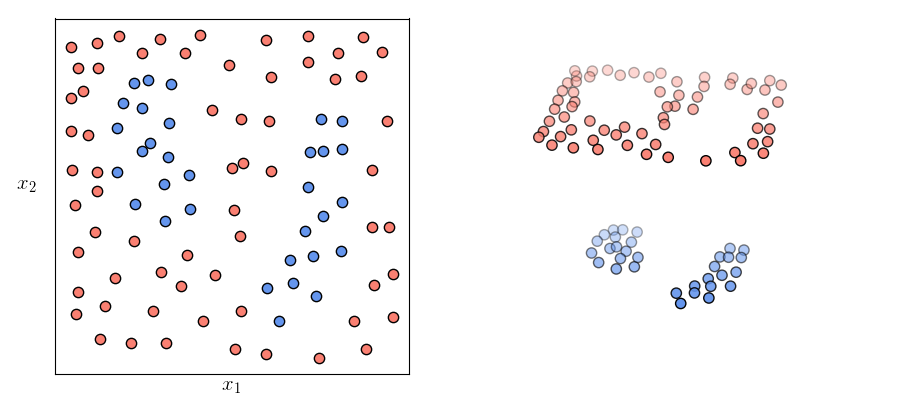
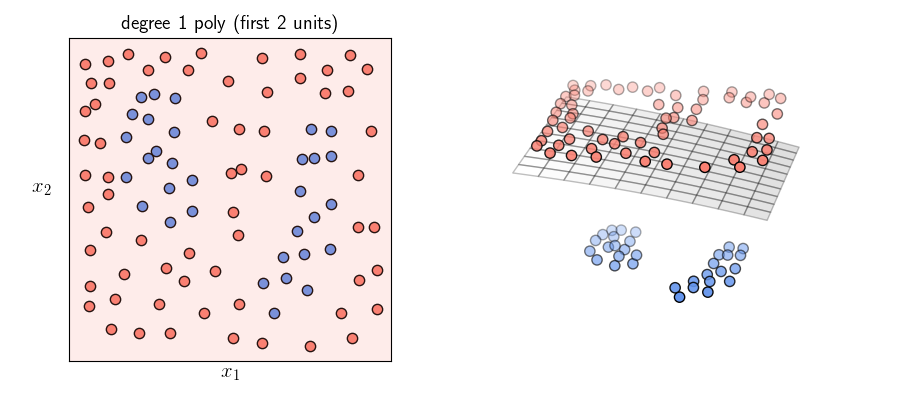
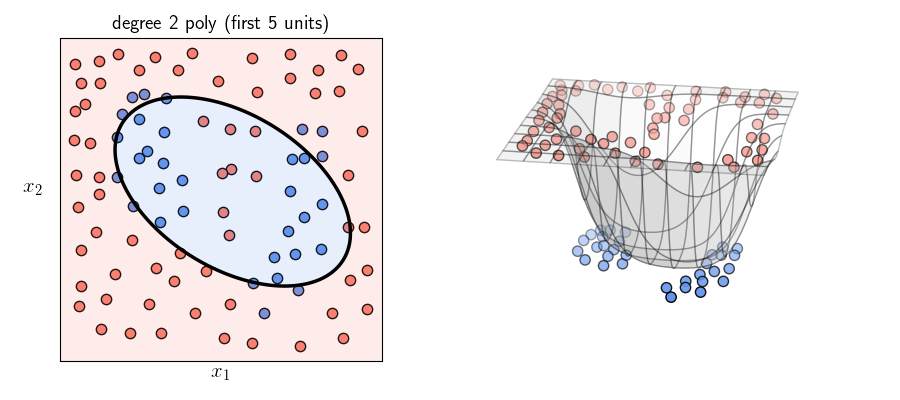
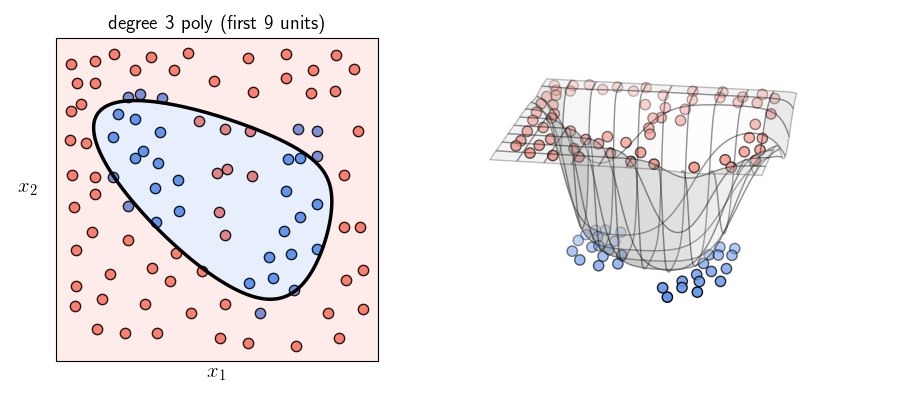
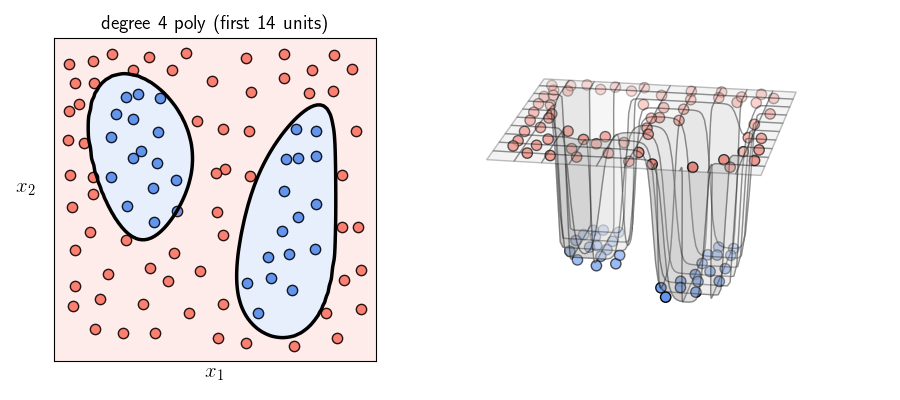
...
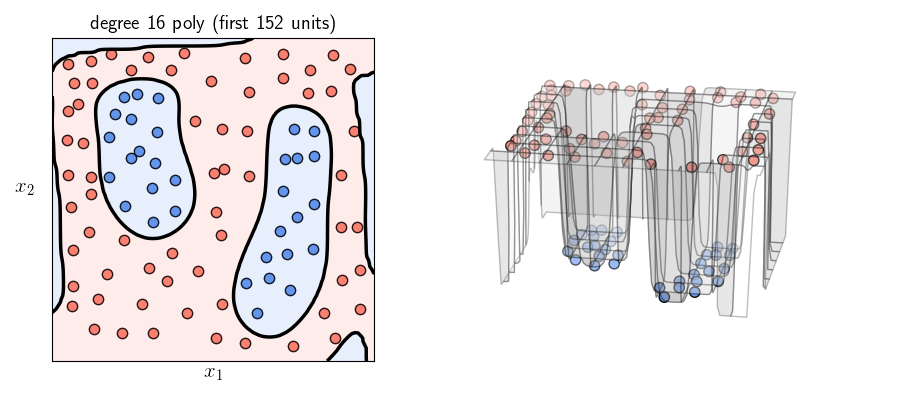
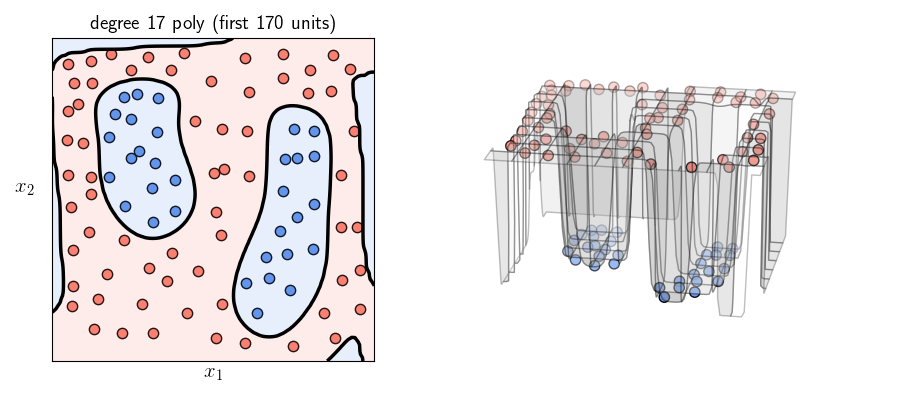
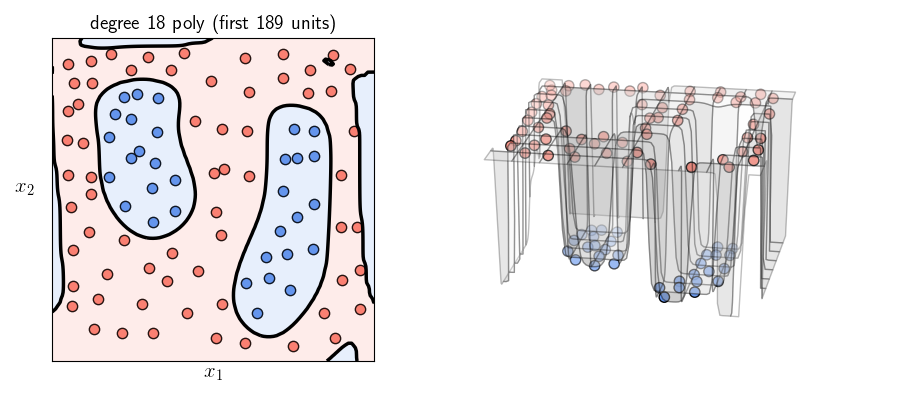
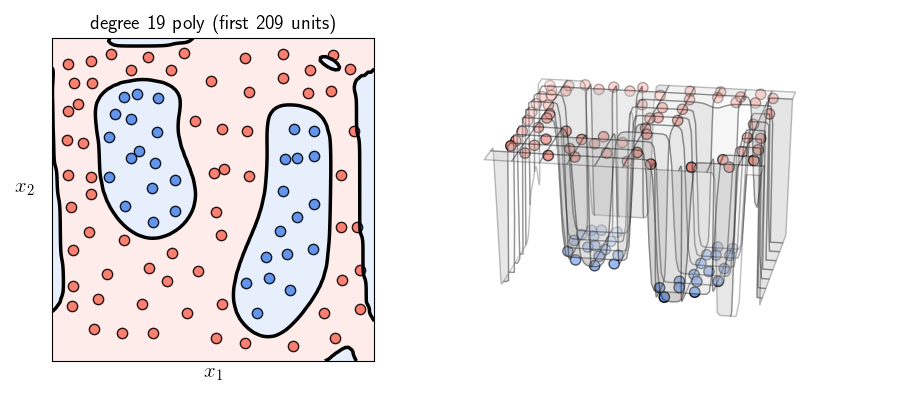
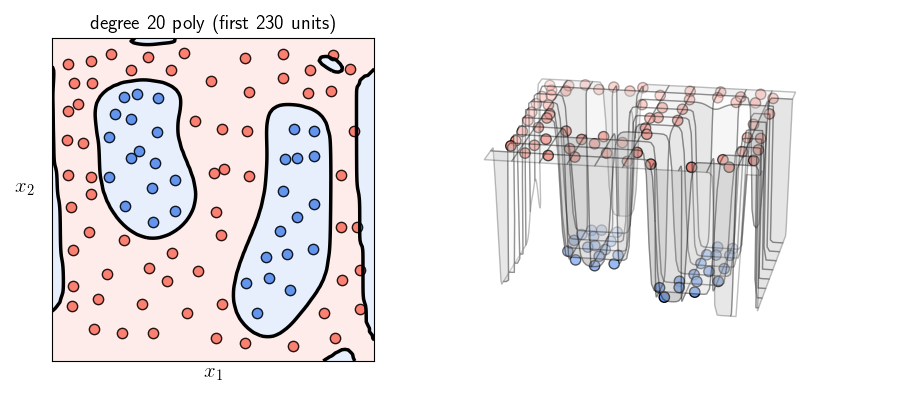

In [5]:
## This code cell will not be shown in the HTML version of this notebook
# run animator for two-class classification fits
csvname = datapath + '2eggs_data.csv'
demo = nonlib.classification_basis_comparison_3d.Visualizer(csvname)

# run animator
demo.brows_single_fits(num_units =  [v for v in range(0,20,1)], basis = 'poly',view = [30,-80])

In the jargon of machine learning / deep learning the amount of nonlinearity, or nonlinear potential, a `model` has is commonly referred to as the `model`'s *capacity*.   With real data in practice we need to make sure our trained `model` does not have *too little* capacity (it is not too rigid) nor *too much* capacity (that it is not too flexible).  In the jargon of our trade this desire - to get the capacity *just right* - often goes by the name the *bias-variance trade-off*.  A `model` with too little capacity is said to *underfit* the data, or to have *high bias*.  Conversely, a `model` with too much capacity is said to *overfit* the data, or have *high variance*. 


Phrasing our pursuit in these terms, this means that with real data we want to tune the capacity of our model 'just right' as to solve this bias-variance trade-off, i.e., so that our `model` has neither too little capacity (a 'high bias' or underfitting) nor too much capacity (a 'high variance' or overfitting).

> With real data in practice we need to make sure our `model` does not have *too little* capacity (it is not too rigid) nor *too much* capacity (that it is not too flexible).  In the jargon of our trade this desire - to get the capacity of our `model` *just right* - often goes by the name the *bias-variance trade-off*.  A `model` with too little capacity is said to *underfit* the data, or to have *high bias*.  Conversely, a `model` with too much capacity is said to *overfit* the data, or have *high variance*. 

## 11.1.5  Training error is the wrong measurement tool for real data

With *perfect data* - where we have (close to) infinitely many training data points that perfectly describe a phenomenon - we have seen that we can always determinine appropriate nonlinearity by *increasing the capacity of our `model`*.  By doing this we consistently *decreases the error of the `model` on this training dataset* - while improving how the `model` represents the (training) data.  

However with *real data* we saw that the situation is more sensitive.  It is still true that by increasing a `model`'s capacity we *decrease* its error on the training data, and this does improve its ability to represent our training data.  But because our training data is not perfect - we usually have only a subsample of (noisy examples of) the true pheenomenon - this becomes problematic when the model begins *overfitting*.  At a certain point of capacity the `model` starts representing our training data *too well*, and becomes a prediction tool for future input.  

The problem here is that *nothing about the training error tells us when a `model` begins to overfit a training dataset*.  The phenomenon of overfitting is not reflected in the training error measurment.  So - in other words - *training error is the wrong measurment tool for determining the proper capacity of a `model`*.  If we are searching through a set of `models`, in search of the one with very best amount of capacity (when properly tuned) for a given dataset, we cannot determine which one is 'best' by relying on training error.  We need a different measurement tool to help us determine the proper amount of nonlinearity a `model` should have with real data.

## 11.1.6  Mixing universal approximators from different families

Notice in the examples here, when constructing a `model` with universal approximator feature transformations we *always* use a single kind of universal approximator per `model`.  That is, we do not mix exemplars from different univeral approximator families - using e.g., a few polynomial units and a few tree units in the same `model`.  This is done for several reasons.  First and foremost - as we will see in Chapters following this one (with one Chapter dedicated to additional technical details relating to each universal approximator family) - by restricting a `model`'s feature transforms to a single family we can (in each of the three cases) better manage our search for a `model` with the proper capacity for a given dataset, optimize the learning process, and better deal with each families' unique eccentricities.

However it is quite common place to learn a set of `models` - each employing a single family of universal approximators - to a dataset, and then combine or *ensemble* the fully trained `models`.  We will discuss this further later on in this Chapter.

&copy; This material is not to be distributed, copied, or reused without written permission from the authors.